In [1]:
import pandas as pd
import os
import numpy as np
import tensorflow as tf
import wave
from matplotlib import pyplot as plt
import librosa
from scipy.signal import butter, lfilter, resample


2025-01-29 16:46:51.212999: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-01-29 16:46:51.443826: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1738198011.529348  123957 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1738198011.553574  123957 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-01-29 16:46:51.769442: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

In [2]:
data_folder = "/home/lucas/Desktop/ELP-sounds-folder"
meta_file = "nn_ele_hb_00-24hr_TrainingSet.txt"
data = pd.read_csv(os.path.join(data_folder, meta_file), delimiter='\t')
negative_signal = ['DUMMY_NoEles', 'DUMMY_noEles']
data = data[~data['Tag 1'].isin(negative_signal)]
data = data[~data['notes'].str.contains('faint|marginal|gorilla', case=False, na=False)]
print(set(data['notes']))
print(len(data))

{'blobby', 'y', 'would take this', nan, 'two-tone call?', 'Q', 'y(missed)', 'f', '2 calls', 'near thunder', "2? - think it's just 1", 'odd shape but suppose its ele', 'on the short side but can see 2 harms', 'm', 'in thunder', 'not in logblind', 'W', 'liz added', 'q-keep', 'many harmonics', 'f?', "m (wasn't in logblind)"}
2991


In [26]:
##### Temp

def draw(stft, sr, title):
    plt.figure(figsize=(10, 6))
    librosa.display.specshow(stft, sr=sr, x_axis="time", y_axis='log', vmin=-10, cmap='RdBu_r')
    plt.colorbar(format='%+2.0f dB')
    plt.title(title)
    plt.xlabel('Time [sec]')
    plt.ylabel('Frequency [Hz]')
    #plt.ylim(0, 512)  # Set the y-axis limit to show frequencies under 100 Hz
    plt.show()


########    Signal processing Functions

def down_sample(audio, input_sr, output_sr):
    """
    input:
        audio: 1D vector
        input_sr: sampling rate (hz)
        output_sr: target sampling rate (hz)

    output:
        1D vector of down sampled audio    
    """
    if input_sr <= output_sr:
        return audio

    num_samples = int(len(audio) * float(output_sr)/ input_sr)
    down_sampled_audio = resample(audio, num_samples)

    return down_sampled_audio

def calc_mean_std(audio):
    audio = tf.cast(audio, tf.float32)
    mean = tf.reduce_mean(audio)
    stddev = tf.math.reduce_std(audio)
    return mean, stddev

def normalize_sample(audio, mean, std):
    return (audio - mean) / std

def butter_lowpass(cutoff, fs, order=5):
    nyquist = 0.5 * fs
    normal_cutoff = cutoff / nyquist
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return b, a

def stft_hann_window(audio, frame_length, frame_step):
    stft = tf.signal.stft(
        audio,
        frame_length=frame_length,
        frame_step=frame_step,
        window_fn=tf.signal.hann_window
    )

    return tf.math.log(tf.abs(stft) + 1e-10).numpy().T

def read_wav_frames(file_path, starting_time, duration):
    with wave.open(file_path, 'rb') as wav_file:

        params = wav_file.getparams()
        sampling_rate = params.framerate
        n_channels = params.nchannels
        sample_width = params.sampwidth
        print(params)

        starting_pos = int(sampling_rate * starting_time)

        wav_file.setpos(starting_pos)
        
        frames = wav_file.readframes(int(sampling_rate * duration))

        dtype = None
        if sample_width == 1:
            dtype = np.int8
        elif sample_width == 2:
            dtype = np.int16
        elif sample_width == 4:
            dtype = np.int32
        else:
            exit()

        data = np.frombuffer(frames, dtype=dtype)
        if n_channels > 1:
            data = data.reshape((-1, n_channels))
        
    return sampling_rate, data

In [38]:

# Parameters for the dsamples
sample_length = 10 # seconds

low_freq = 0 # hz
high_freq = 512 # hz

target_sr = 4000 # hz

frame_length = 2048
frame_step = 128

frequency_resolution = target_sr / frame_length
print(frequency_resolution)

1.953125


Opening file: /home/lucas/Desktop/ELP-sounds-folder/nn10a_20180913_000000.wav
_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


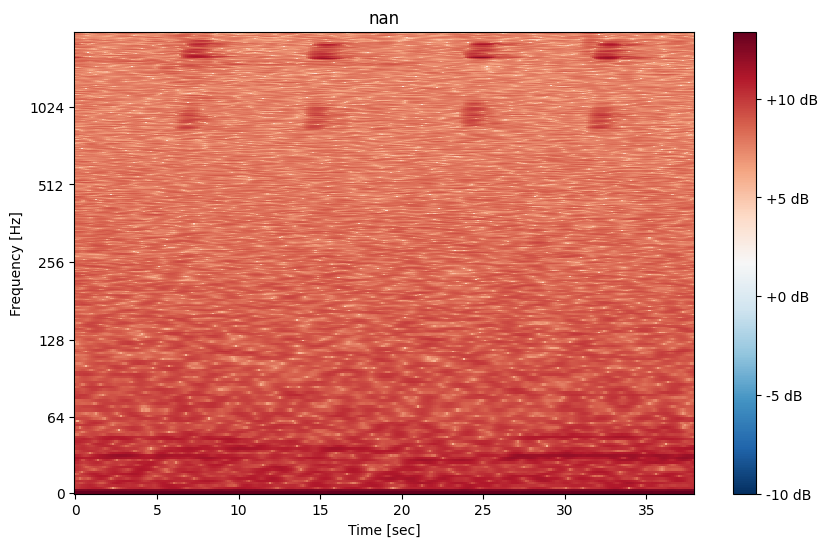

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


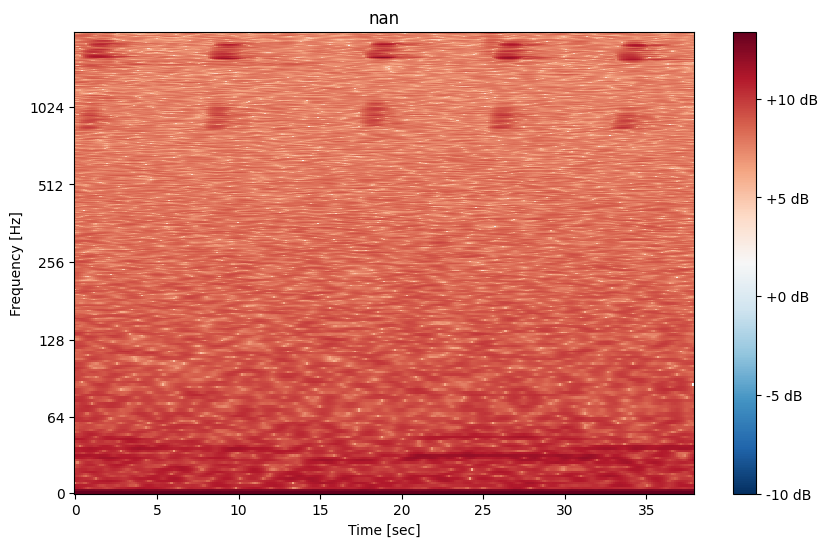

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


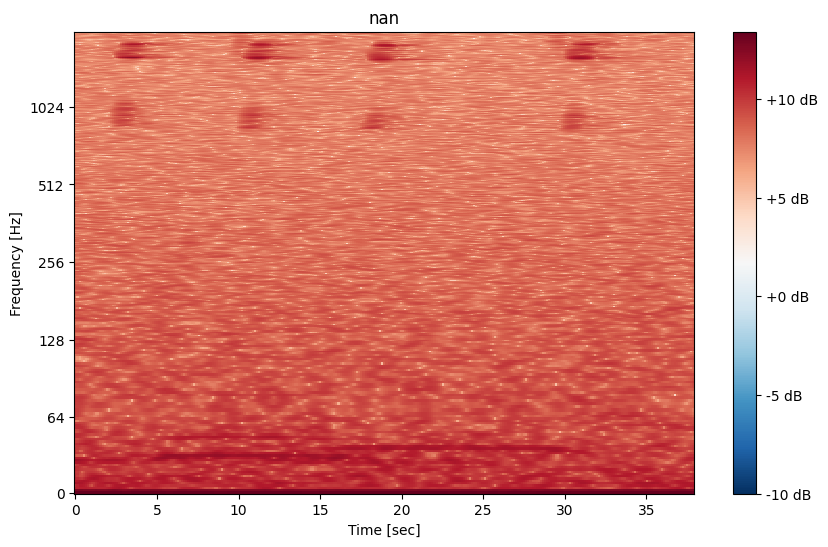

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


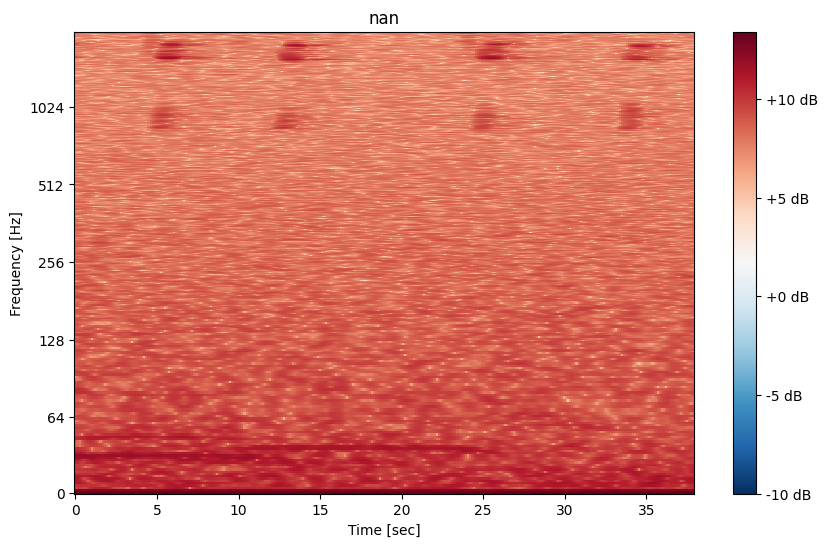

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


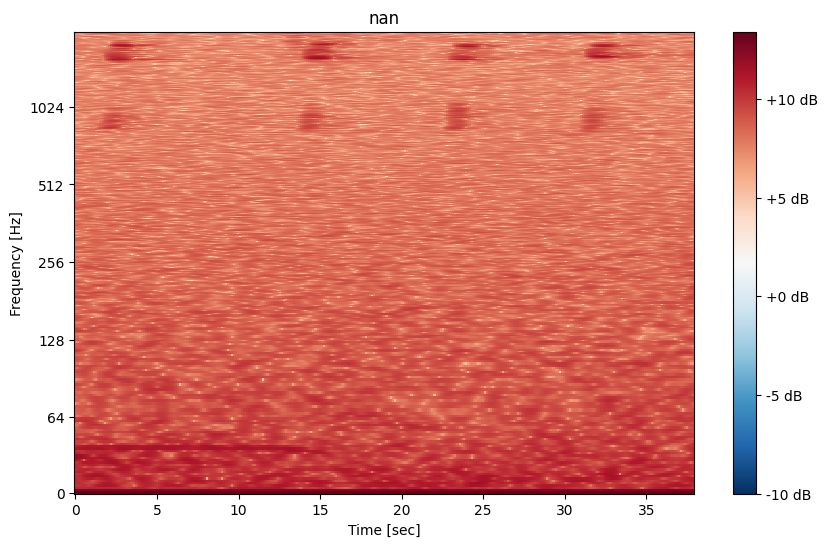

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


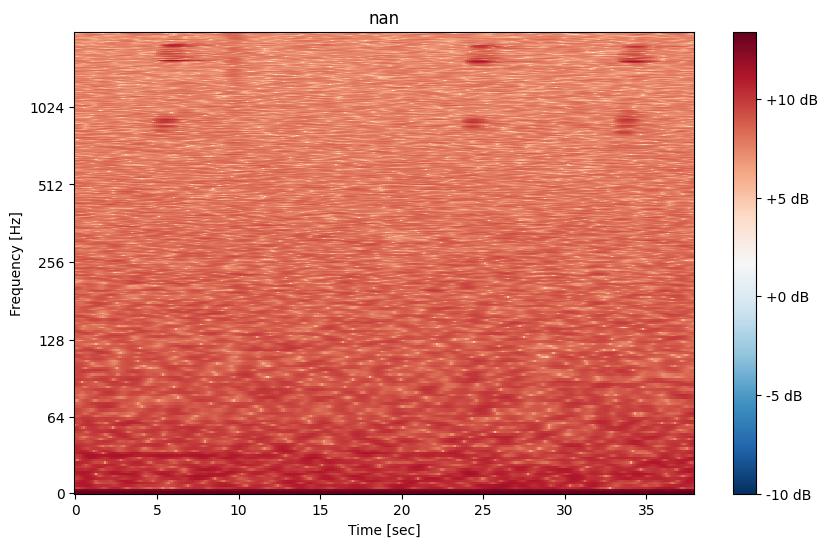

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


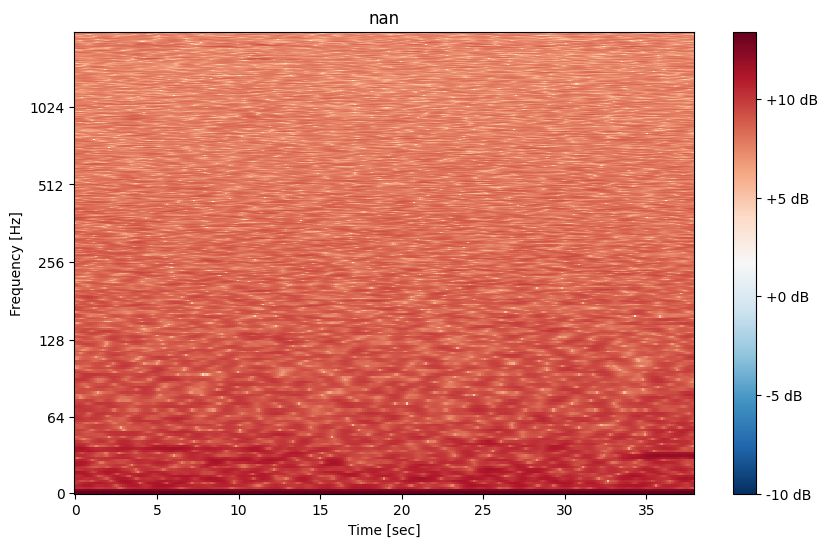

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


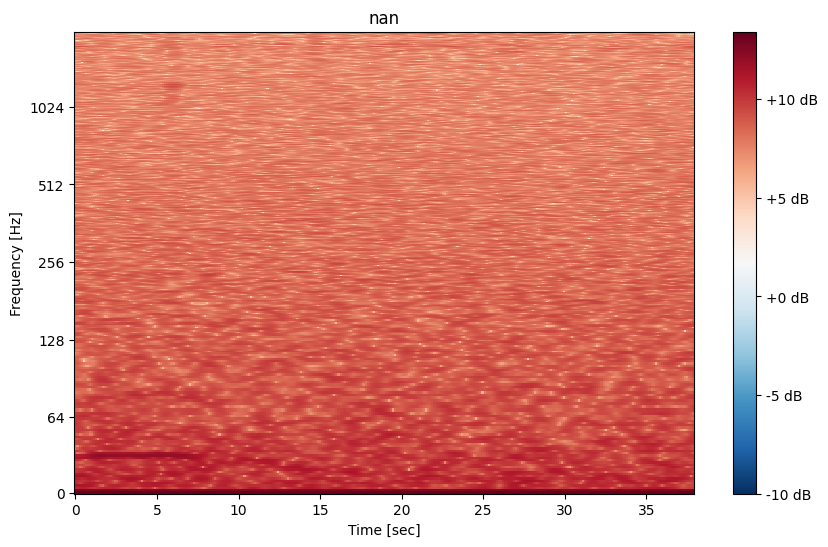

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


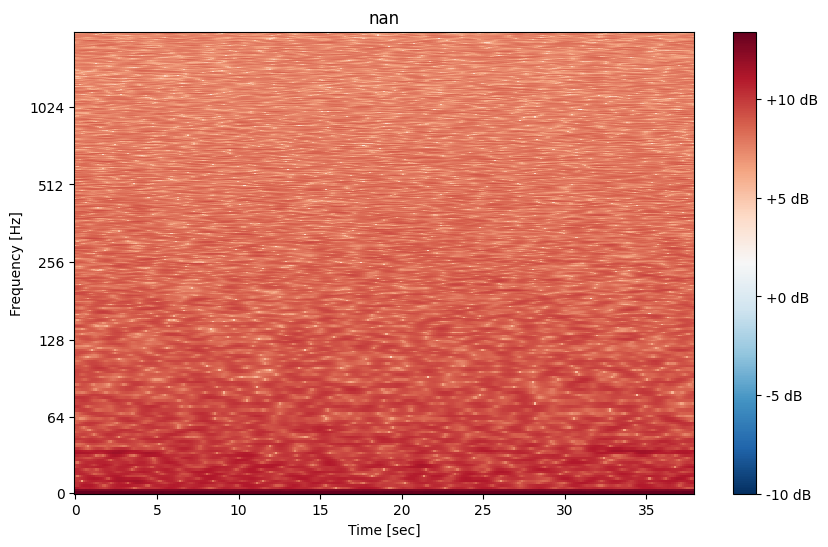

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


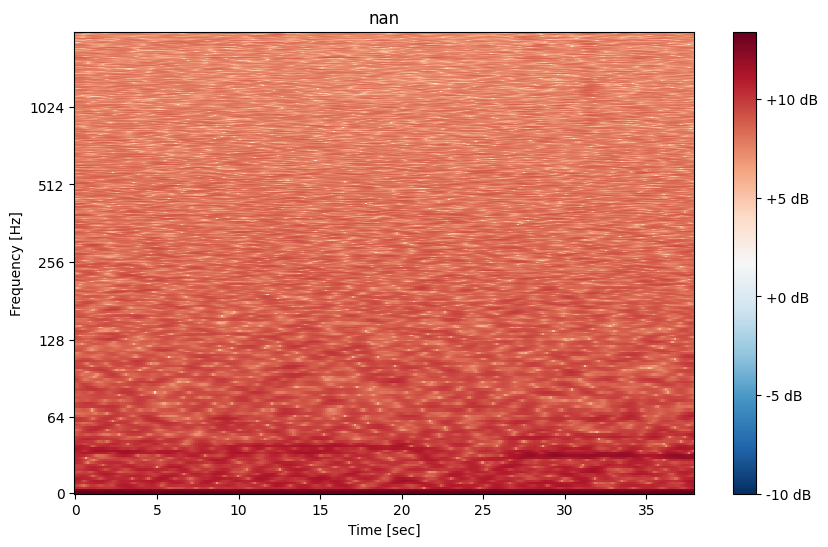

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


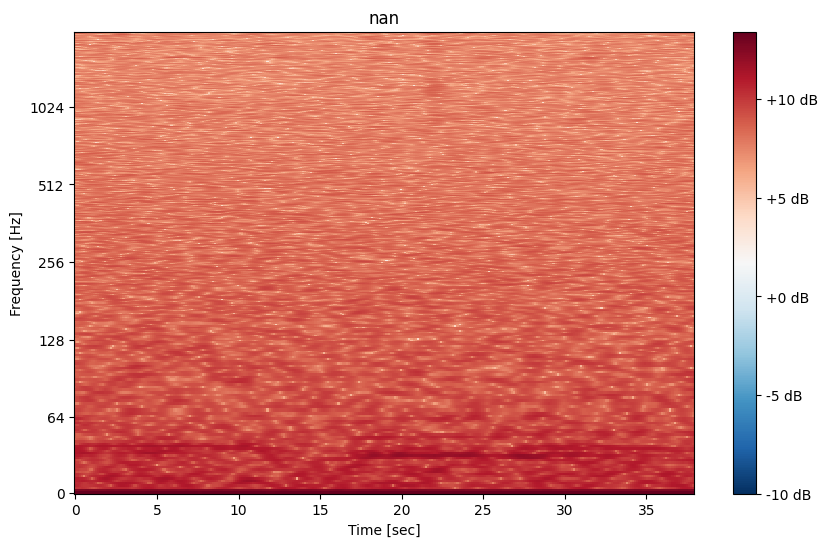

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


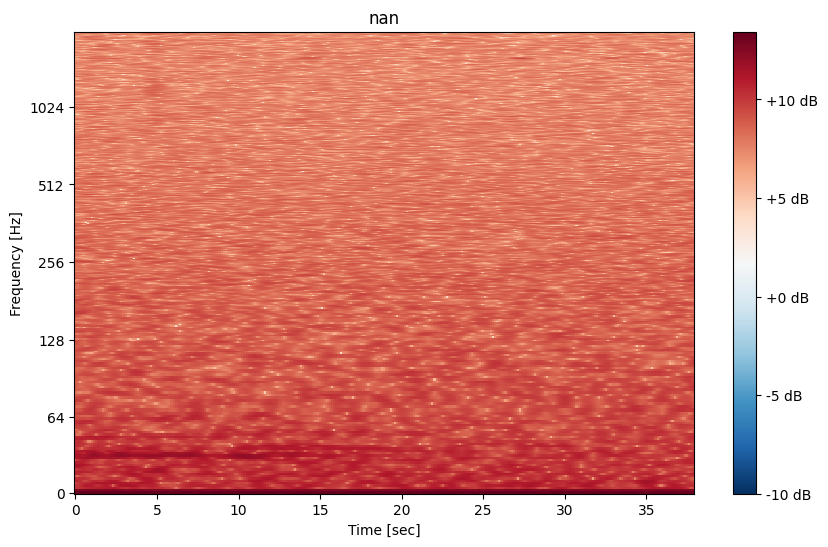

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


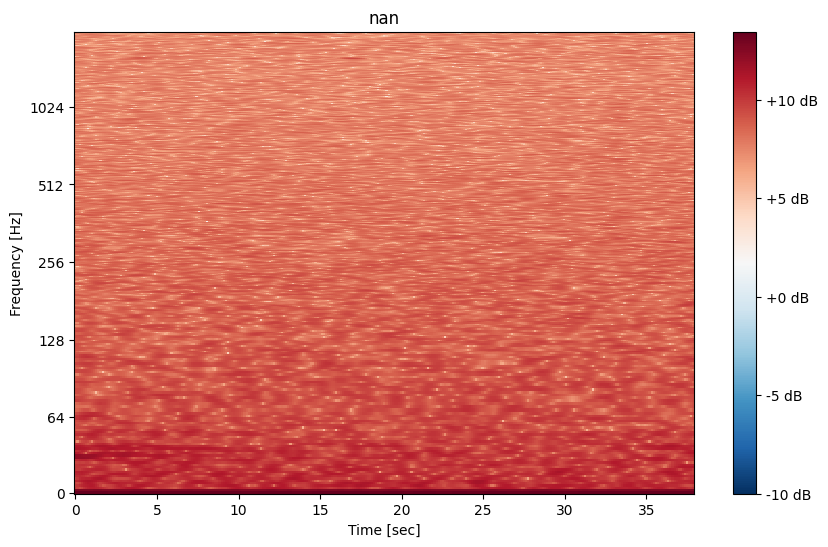

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


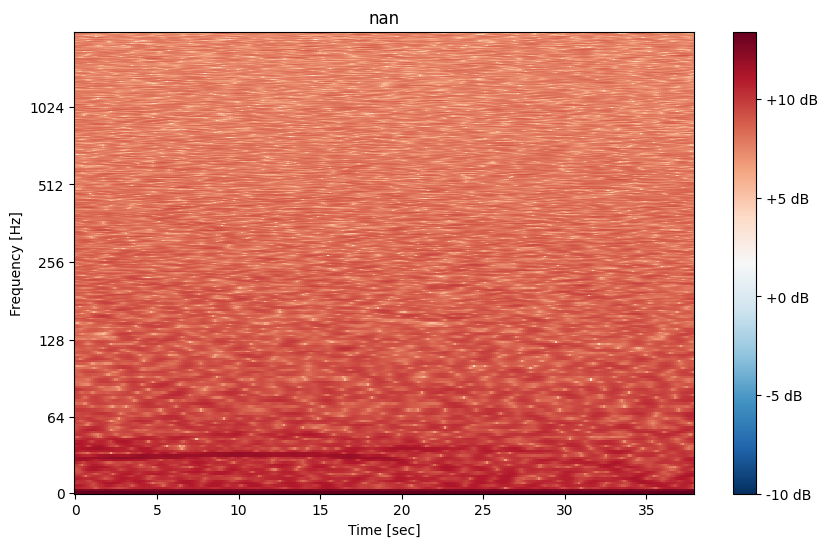

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


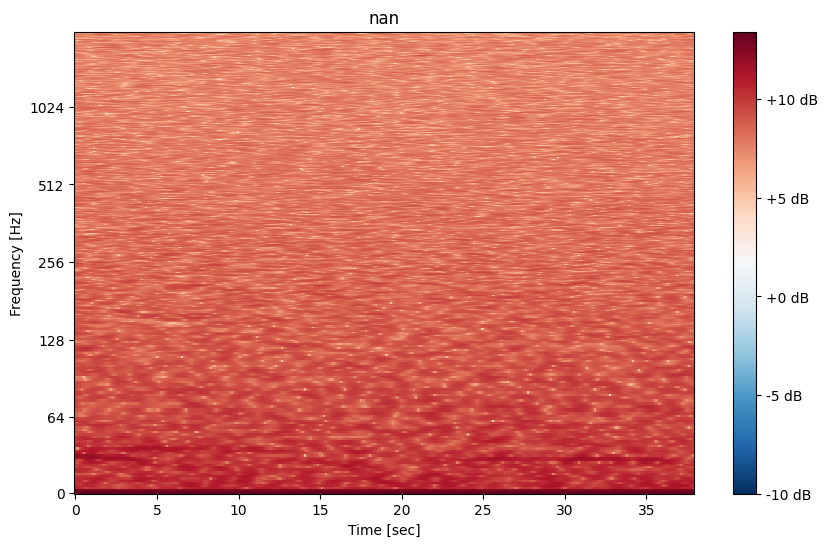

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


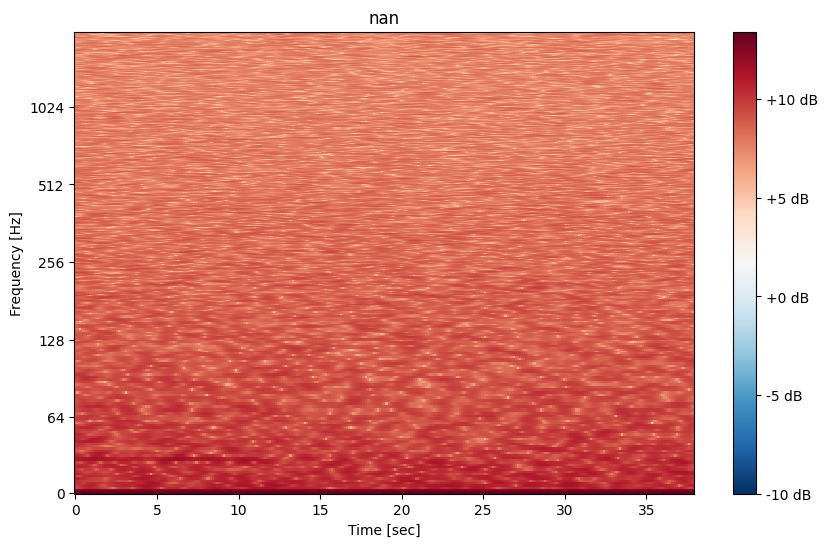

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


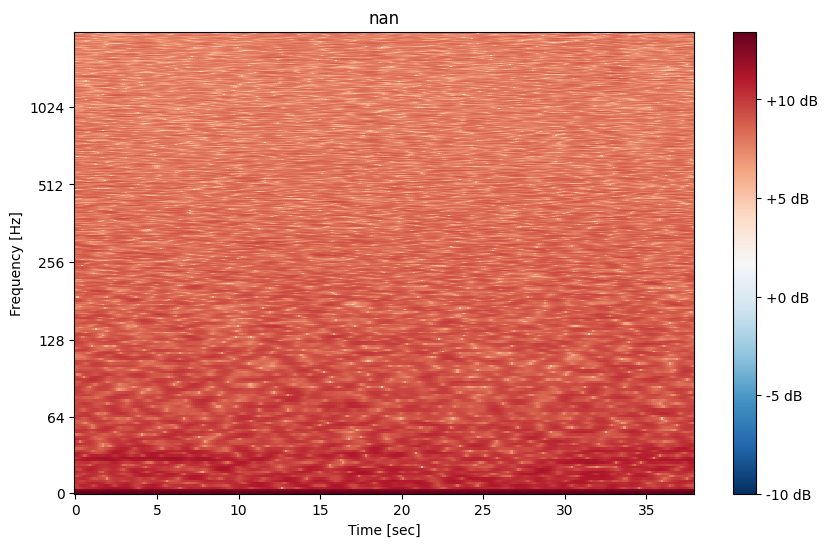

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


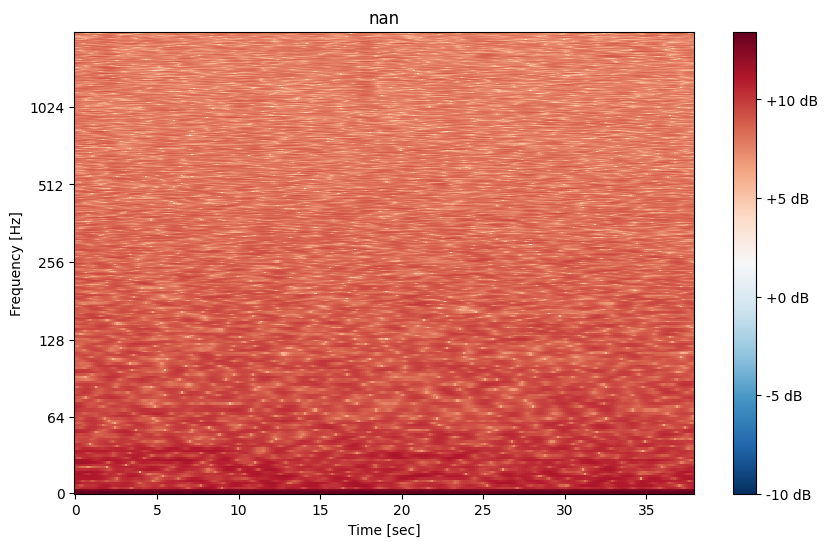

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


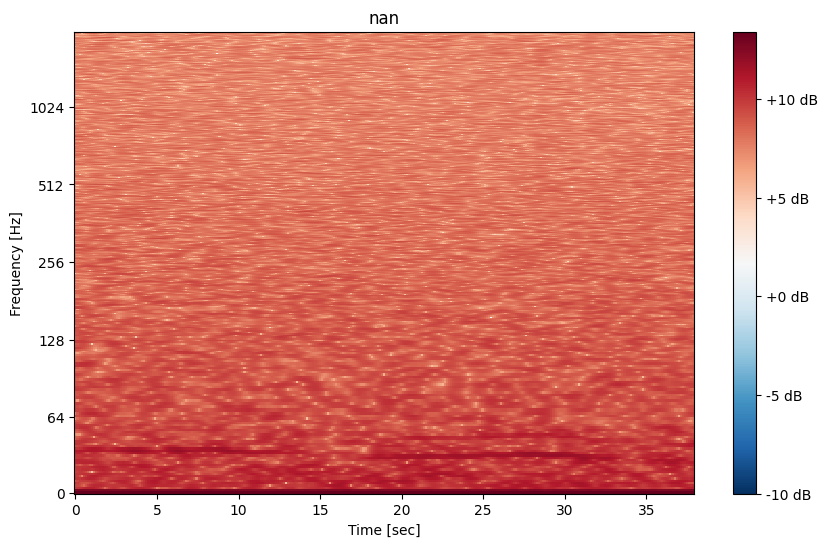

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


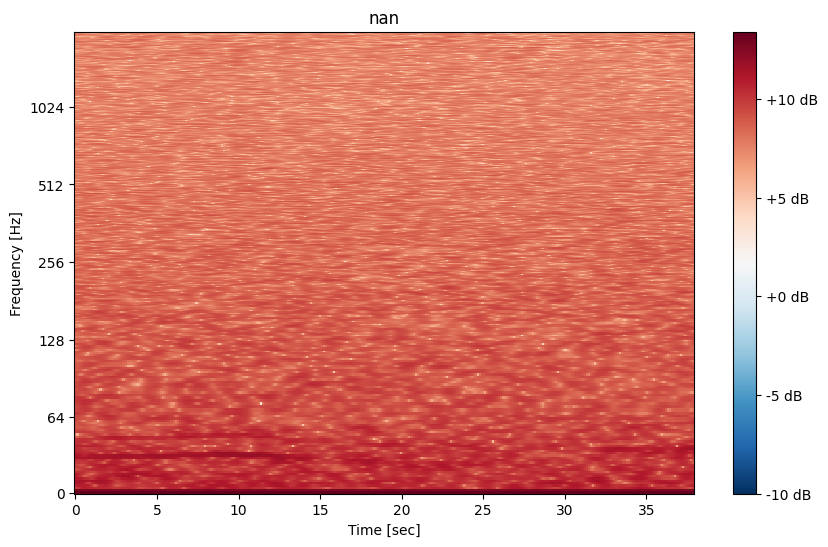

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


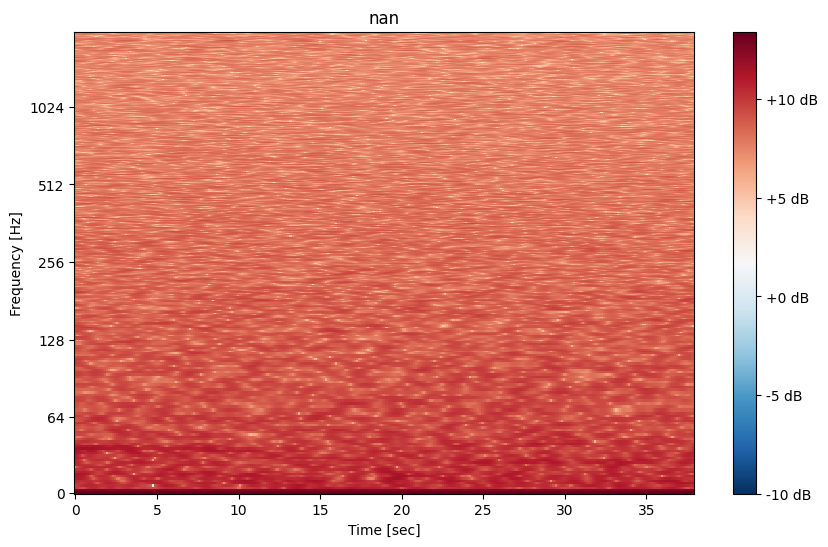

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


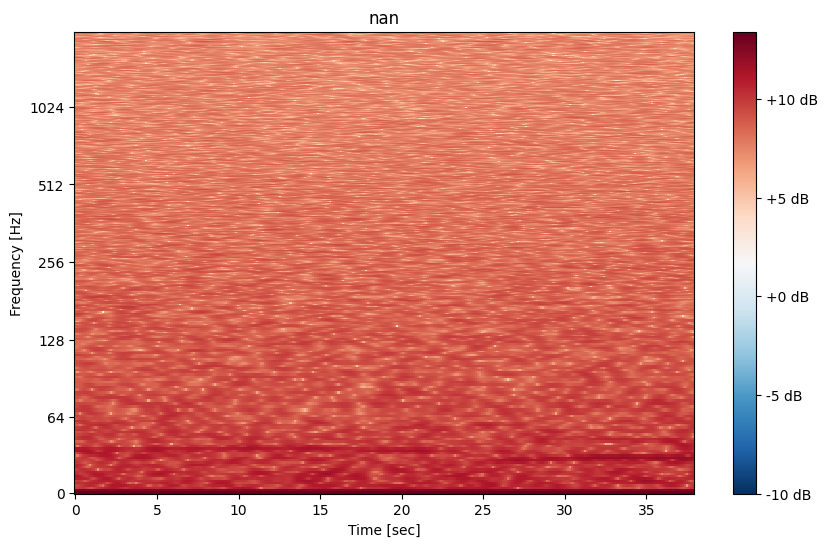

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


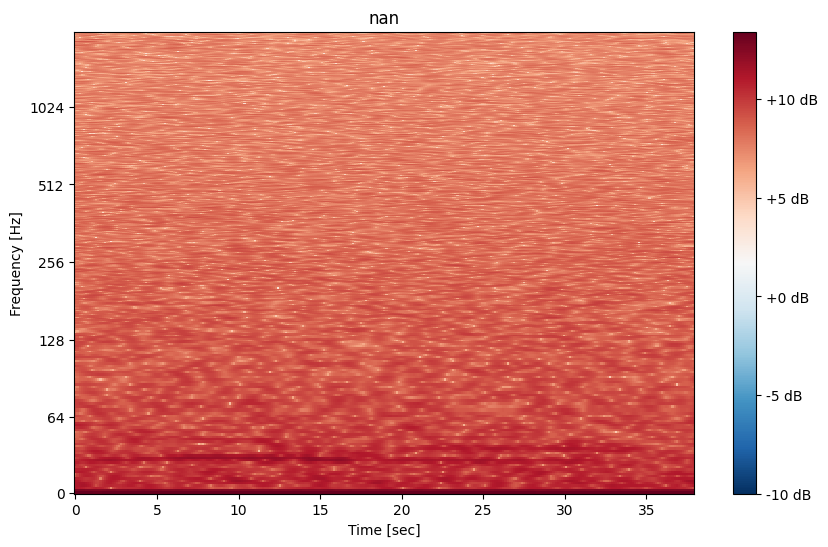

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


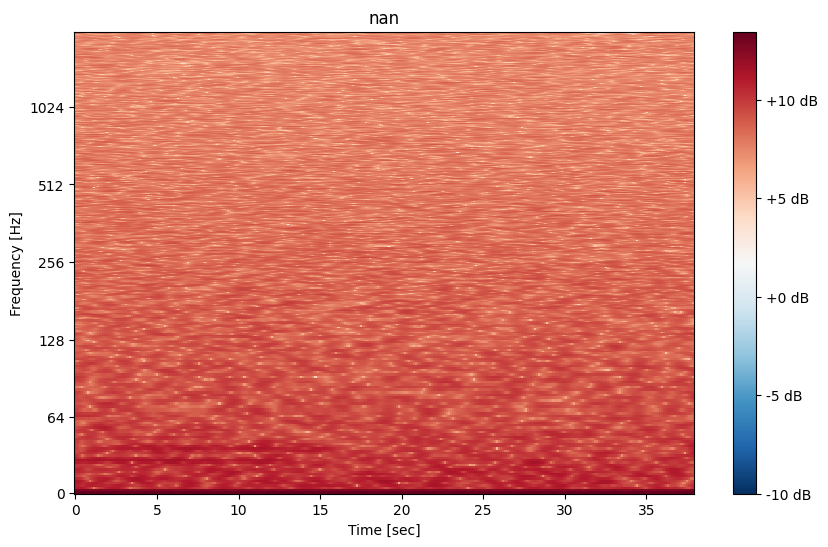

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


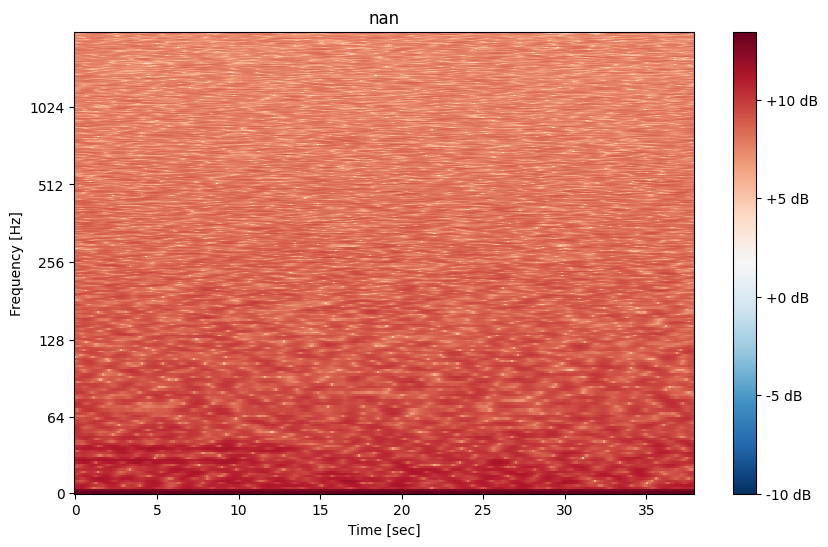

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


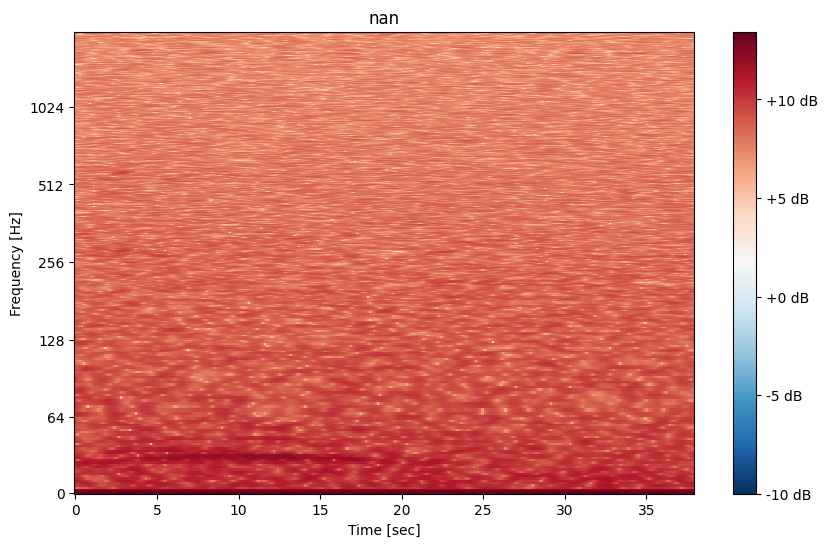

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


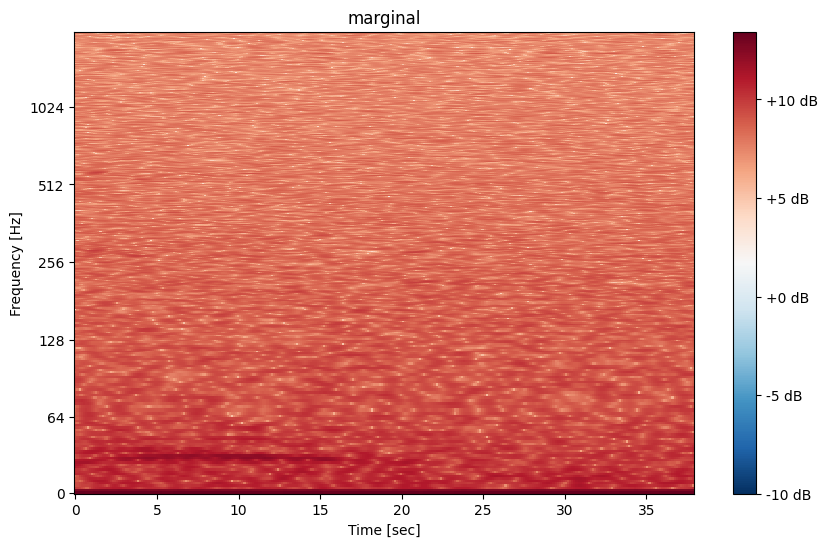

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


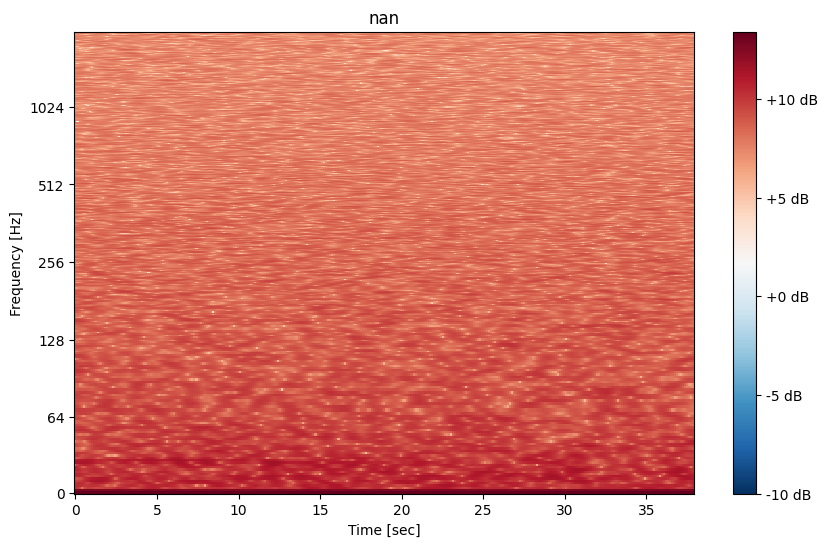

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


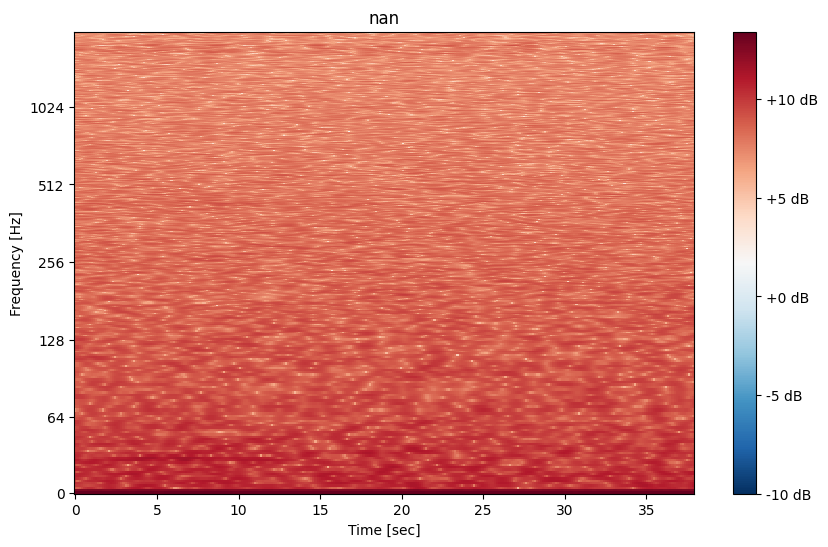

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


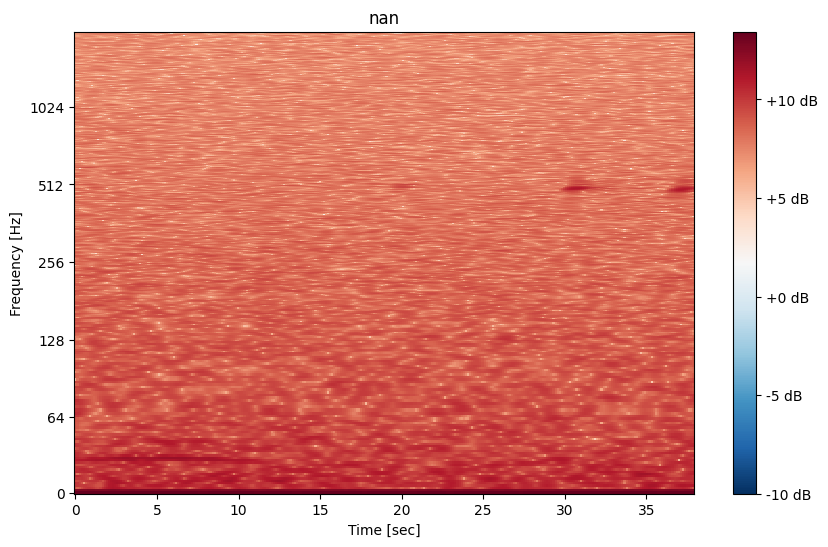

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


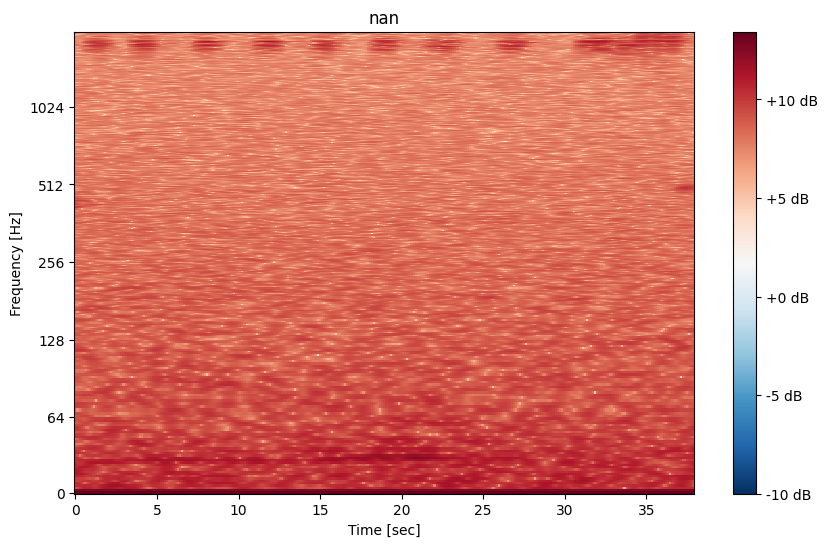

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


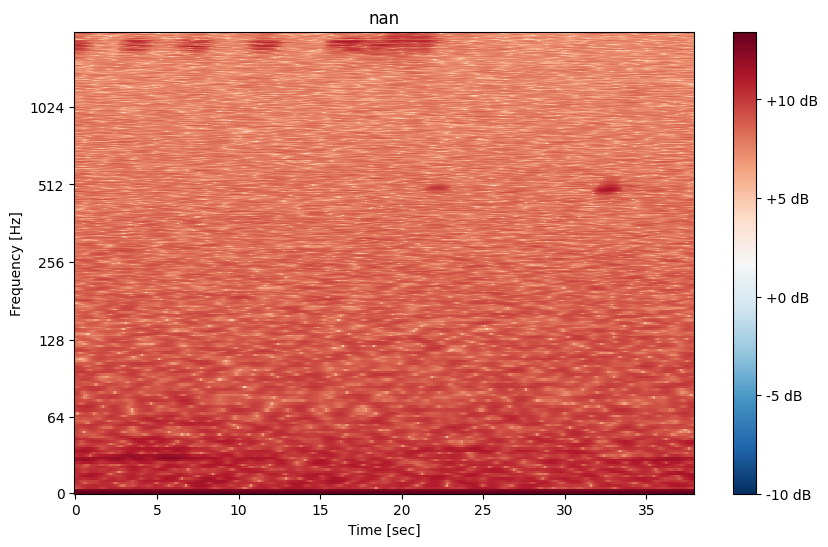

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


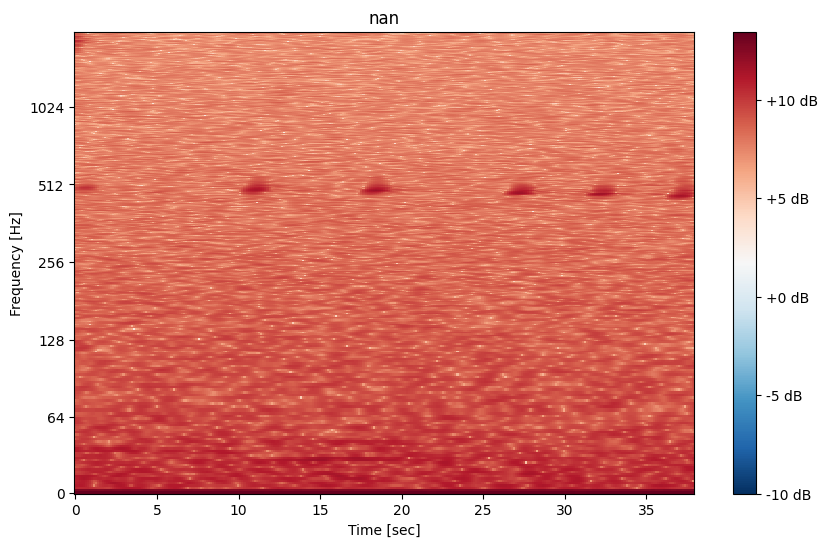

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


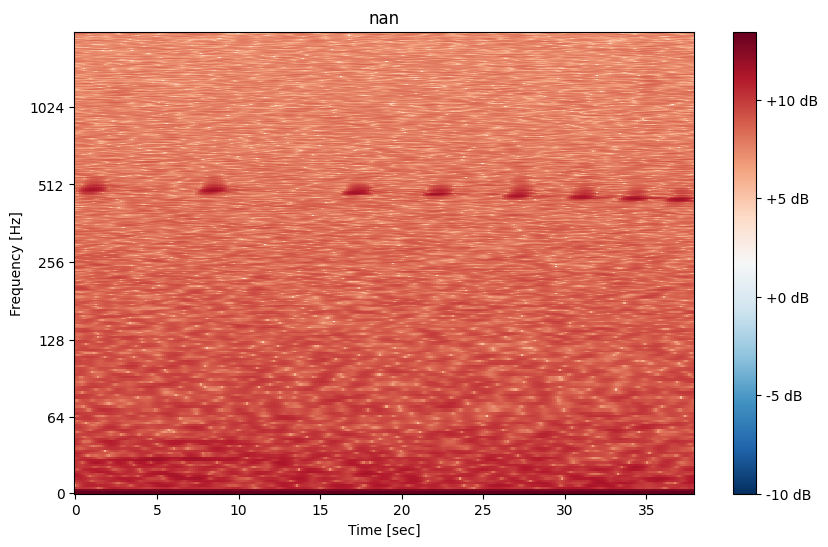

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


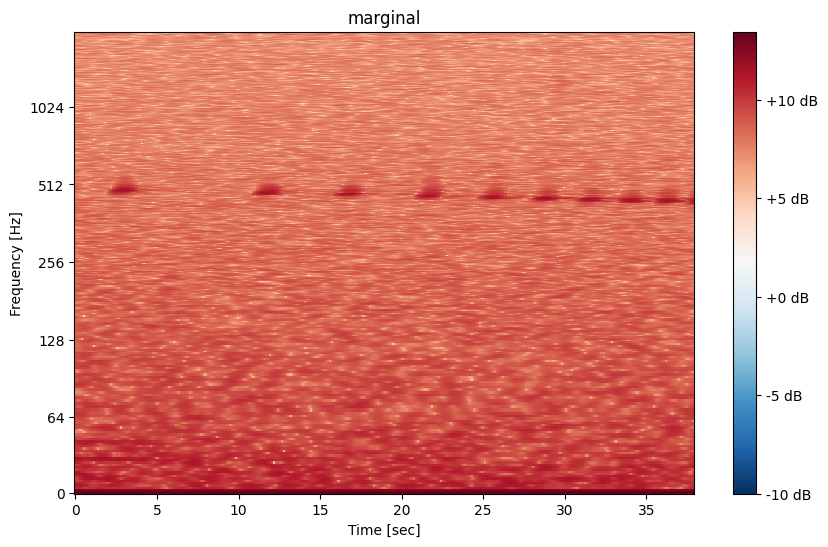

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


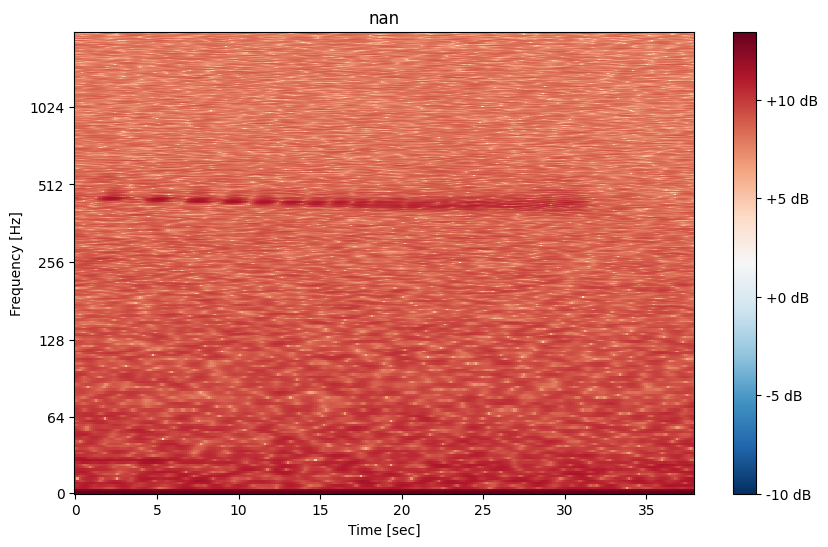

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


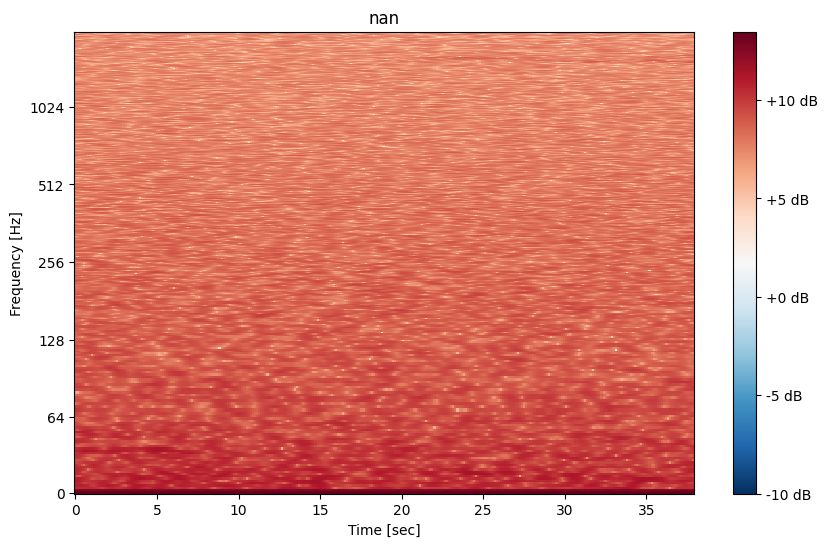

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


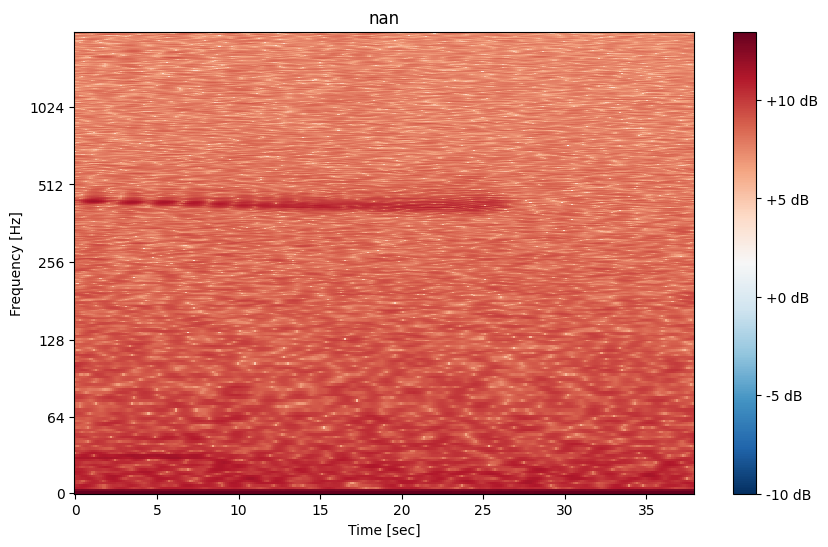

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


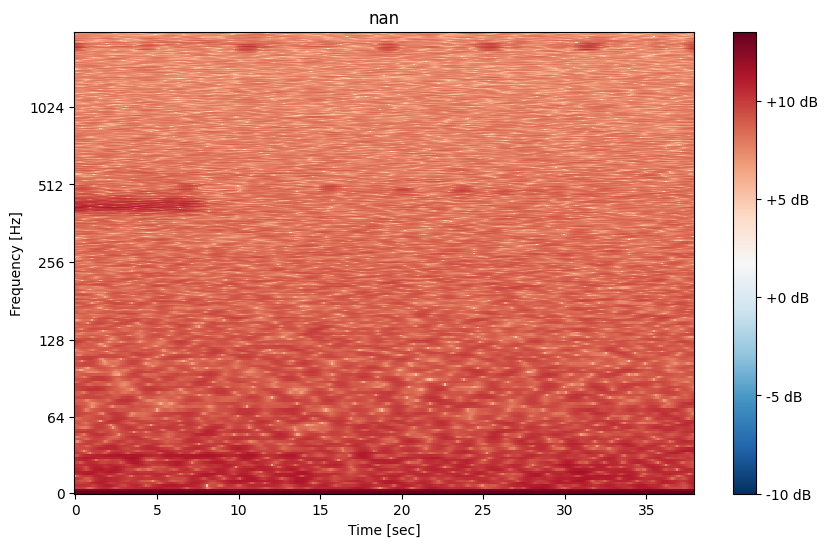

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


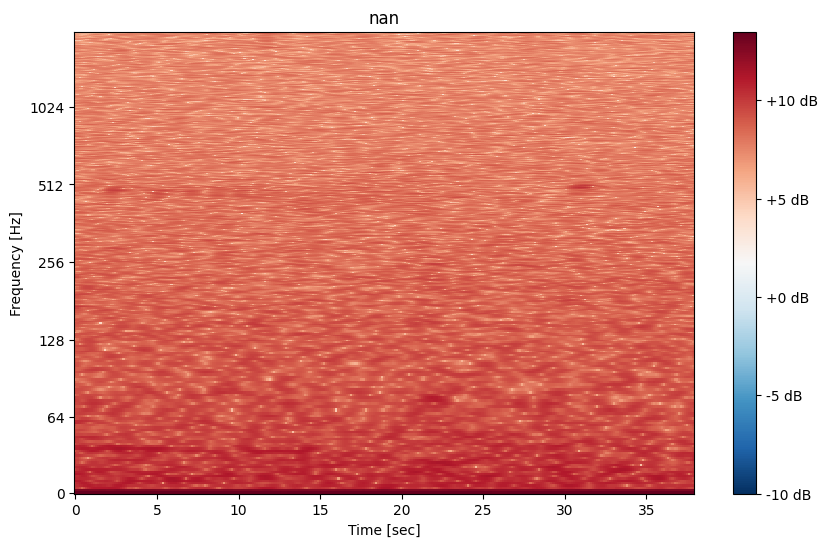

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


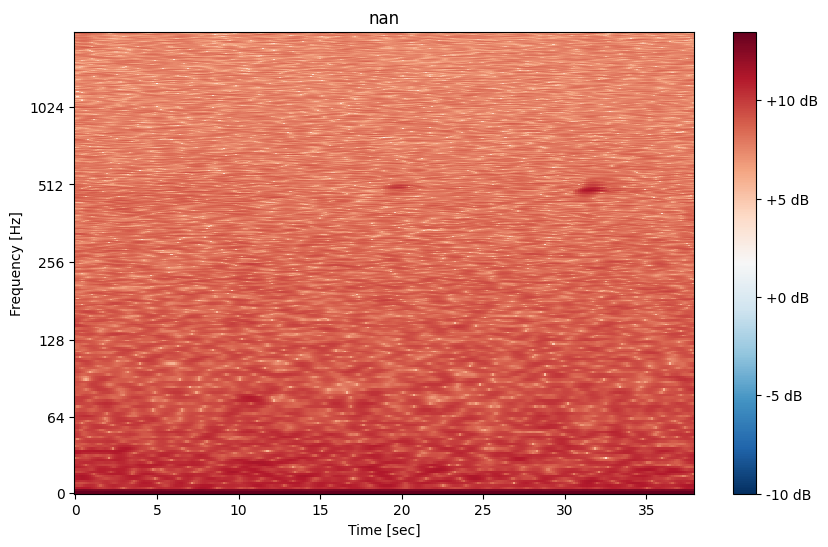

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


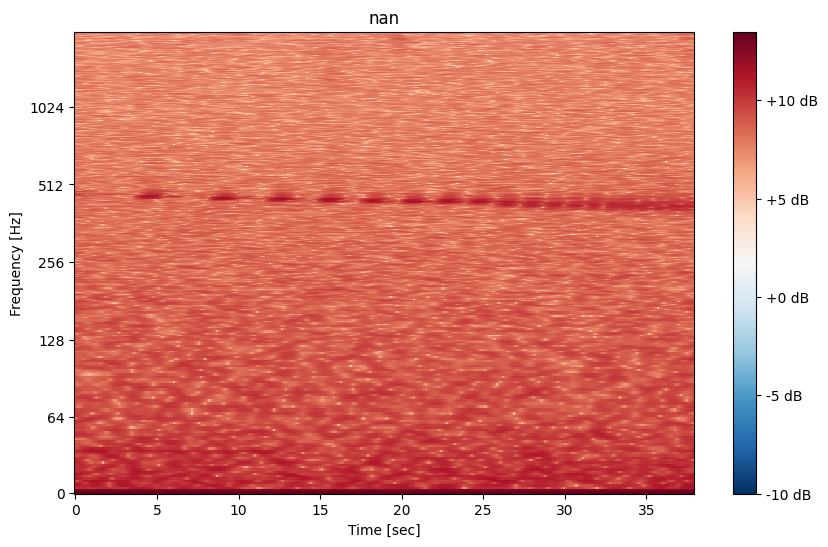

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690733033, comptype='NONE', compname='not compressed')
(1025, 297)


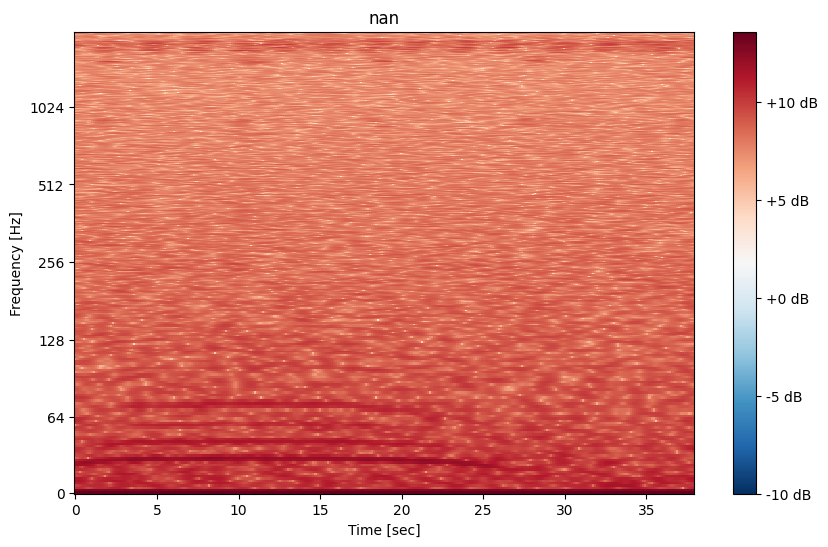

Opening file: /home/lucas/Desktop/ELP-sounds-folder/nn01d_20180222_000000.wav
_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690724841, comptype='NONE', compname='not compressed')
(1025, 297)


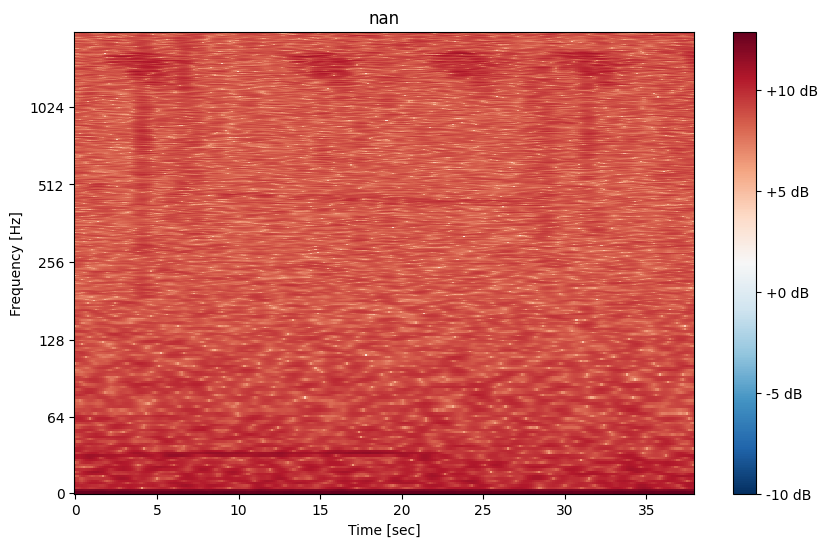

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690724841, comptype='NONE', compname='not compressed')
(1025, 297)


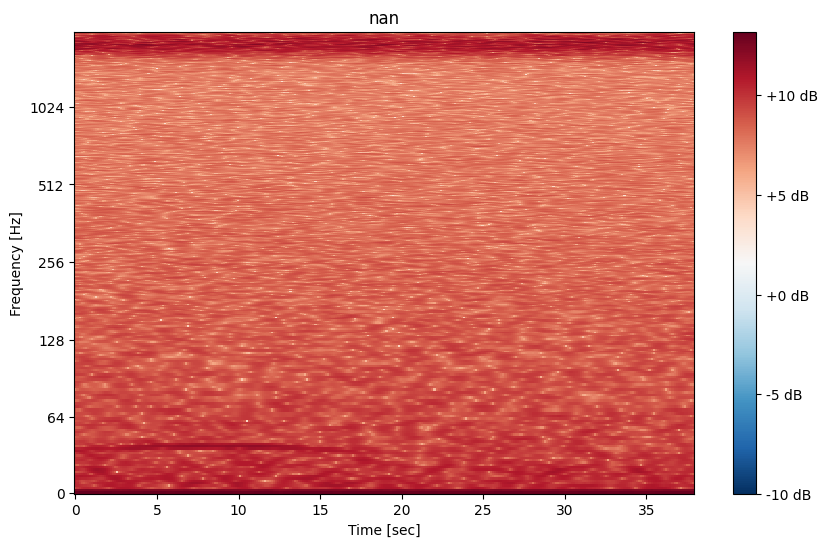

Opening file: /home/lucas/Desktop/ELP-sounds-folder/nn01c_20180417_000000.wav
_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690724841, comptype='NONE', compname='not compressed')
(1025, 297)


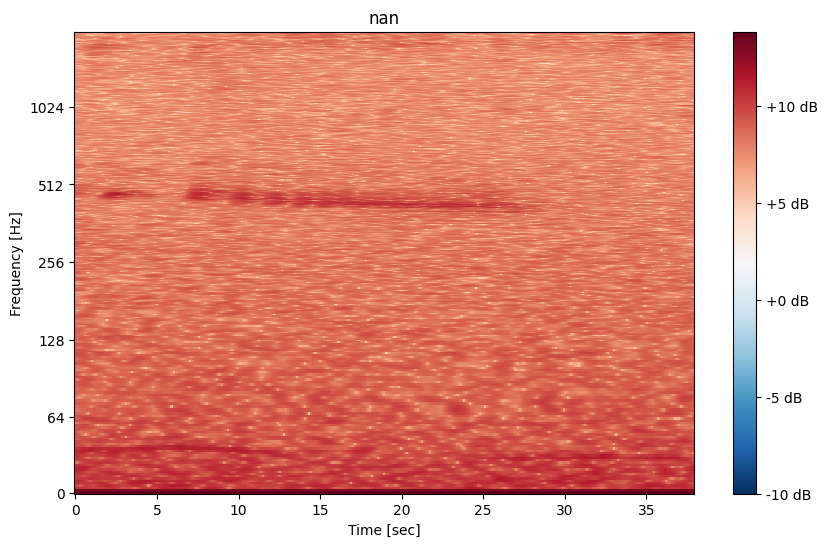

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690724841, comptype='NONE', compname='not compressed')
(1025, 297)


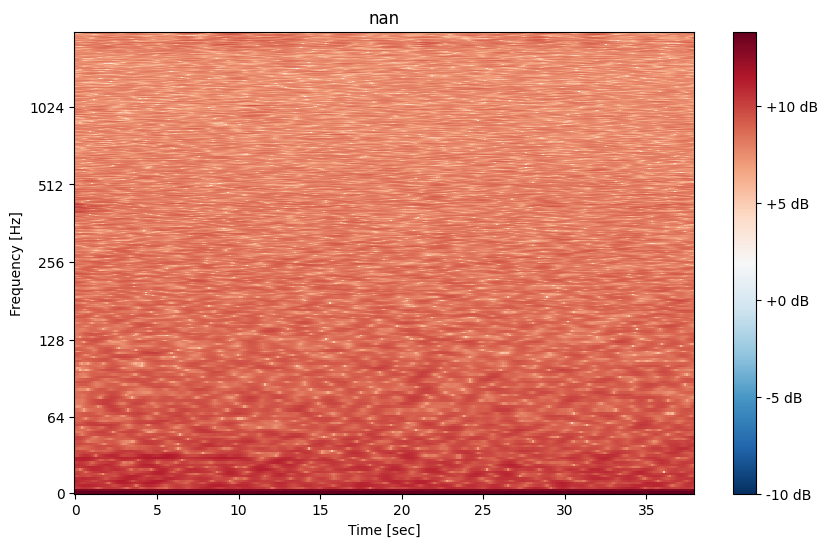

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690724841, comptype='NONE', compname='not compressed')
(1025, 297)


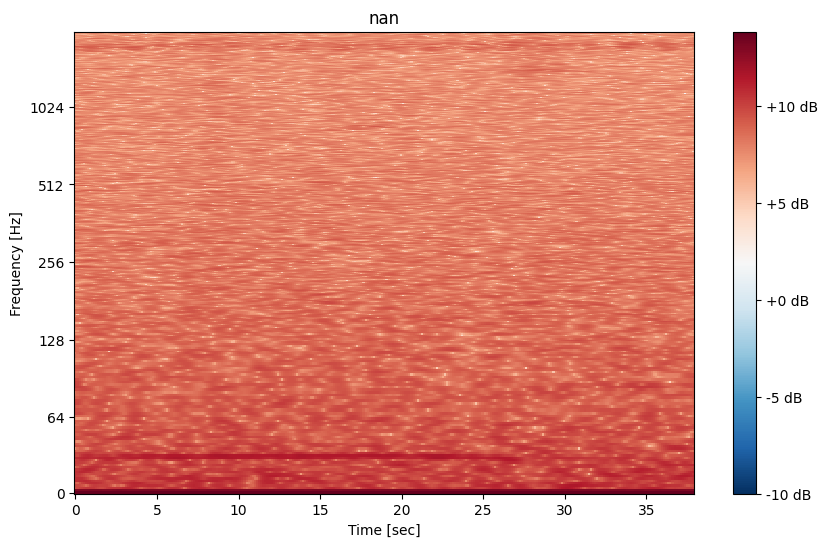

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690724841, comptype='NONE', compname='not compressed')
(1025, 297)


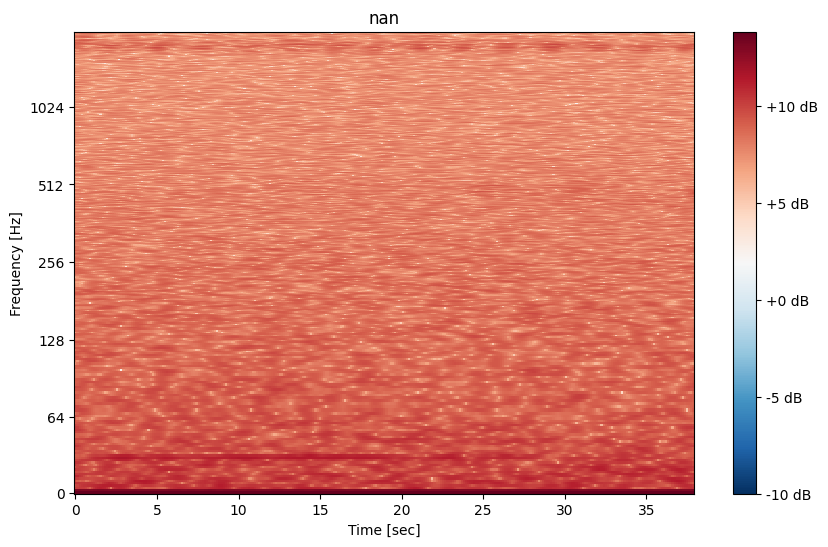

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690724841, comptype='NONE', compname='not compressed')
(1025, 297)


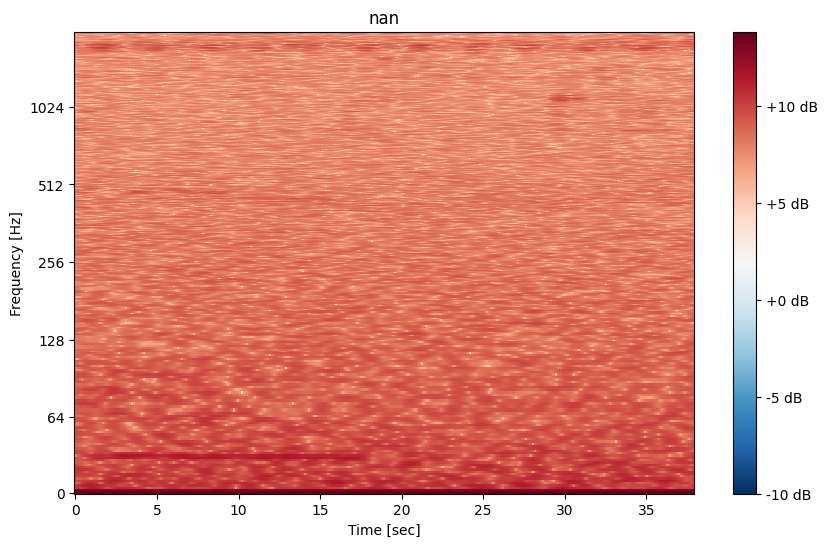

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690724841, comptype='NONE', compname='not compressed')
(1025, 297)


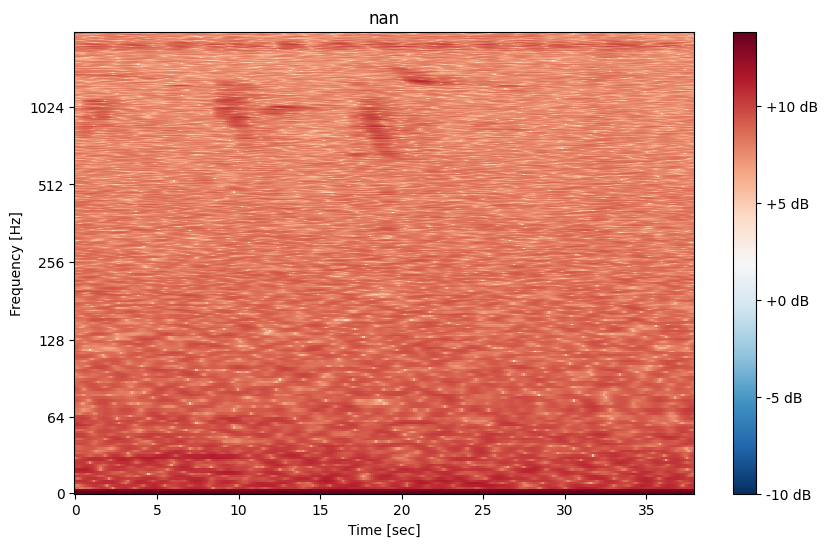

_wave_params(nchannels=1, sampwidth=2, framerate=8000, nframes=690724841, comptype='NONE', compname='not compressed')
(1025, 297)


KeyboardInterrupt: 

In [39]:
data_folder = "/home/lucas/Desktop/ELP-sounds-folder"
meta_file = "nn_ele_hb_00-24hr_TrainingSet.txt"

# Load the meta data
data = pd.read_csv(os.path.join(data_folder, meta_file), delimiter='\t')
negative_signal = ['DUMMY_NoEles', 'DUMMY_noEles']
data = data[~data['Tag 1'].isin(negative_signal)]


count = 0
for file in set(data['Begin File']):
    target_file = os.path.join(data_folder, file)

    if os.path.exists(target_file):
        print(f"Opening file: {target_file}")
        clips = data[data['Begin File'] == file]

        # Create positive samples of elephant rumbles
        for i, clip in clips.iterrows():
            if count > 100:
                break

            sampling_rate, audio_clip = read_wav_frames(target_file, clip['File Offset (s)'], sample_length)

            # Process
            audio_clip = np.asarray(audio_clip, dtype=np.int16)
            audio_clip = down_sample(audio_clip, sampling_rate, target_sr)

            stft = stft_hann_window(audio_clip, frame_length=frame_length, frame_step=frame_step)   
            print(stft.shape)
            draw(stft, target_sr, clip['notes'])
            count += 1

